##**EDA**

In [1]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import optuna
from lightgbm import LGBMClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score
from lightgbm import early_stopping, log_evaluation
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
import joblib

/Users/SHAD/.pyenv/versions/3.10.6/envs/peaklytics/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
df = pd.read_csv('/Users/SHAD/code/Parvxi/Peaklytics/raw_data/Peaklytics_intial_data.csv')
df.head()

,Unnamed: 0,name,market,funding_total_usd,status,region,city,funding_rounds,founded_at,founded_month,...,round_A,round_B,round_C,round_D,round_E,round_F,round_G,round_H,country,quater
0,0,#waywire,News,1750000.0,acquired,New York City,New York,1.0,2012-06-01,2012-06,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States,Q2
1,2,'Rock' Your Paper,Publishing,40000.0,operating,Tallinn,Tallinn,1.0,2012-10-26,2012-10,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Estonia,Q4
2,3,(In)Touch Network,Electronics,1500000.0,operating,London,London,1.0,2011-04-01,2011-04,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United Kingdom,Q2
3,4,-R- Ranch and Mine,Tourism,60000.0,operating,Dallas,Fort Worth,2.0,2014-01-01,2014-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States,Q1
4,10,"1,2,3 Listo",E-Commerce,40000.0,operating,Santiago,Las Condes,1.0,2012-01-01,2012-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Chile,Q1


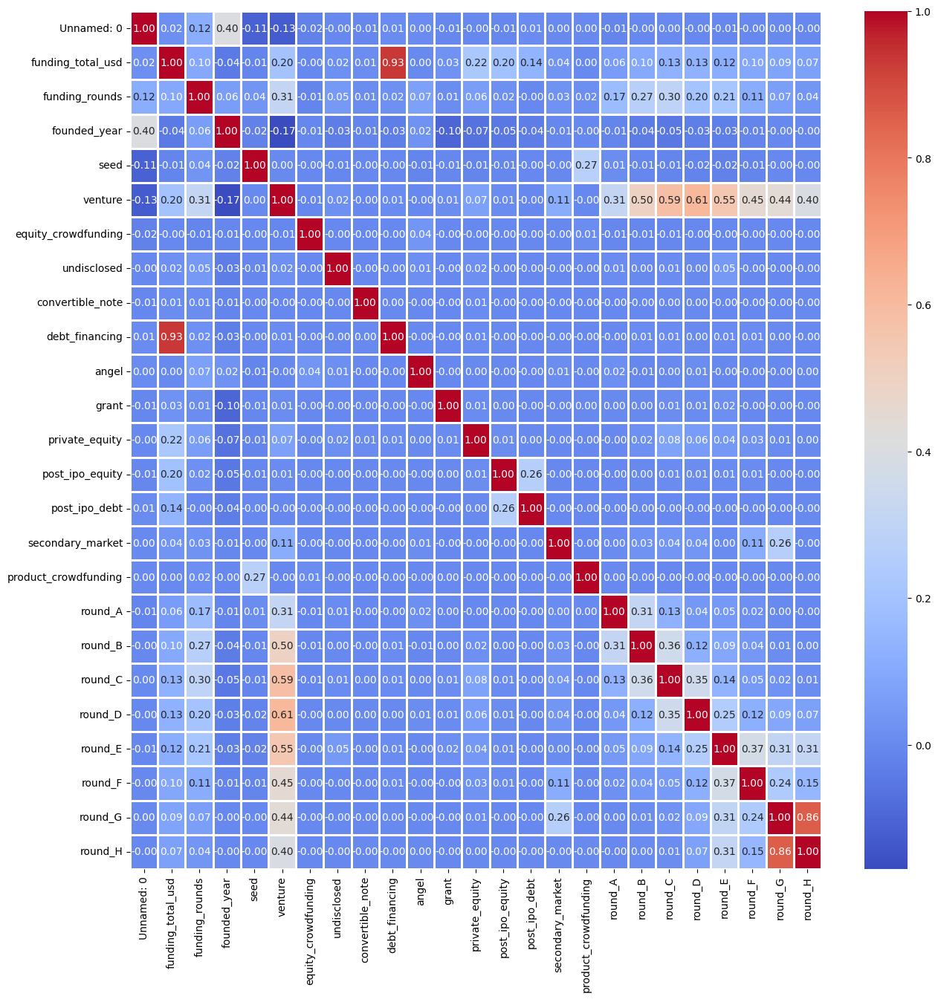

In [3]:
numerical_columns = df.select_dtypes(include=[np.number]).columns

corr_matrix = df[numerical_columns].corr()
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.8, fmt='.2f', ax=ax)
plt.show()

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43268 entries, 0 to 43267
Data columns (total 37 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            43268 non-null  int64  
 1   name                  43268 non-null  object 
 2   market                43268 non-null  object 
 3   funding_total_usd     43268 non-null  float64
 4   status                43268 non-null  object 
 5   region                43268 non-null  object 
 6   city                  43268 non-null  object 
 7   funding_rounds        43268 non-null  float64
 8   founded_at            43268 non-null  object 
 9   founded_month         43268 non-null  object 
 10  founded_quarter       43268 non-null  object 
 11  founded_year          43268 non-null  float64
 12  first_funding_at      43268 non-null  object 
 13  last_funding_at       43268 non-null  object 
 14  seed                  43268 non-null  float64
 15  venture            

Detect the missing values, from the corr whatever is causing a problem like Round G, H will be dropped

In [5]:
missing_percentage = (df.isnull().sum() / df.shape[0]) * 100
missing_percentage_sorted = missing_percentage.sort_values(ascending=False)

print(missing_percentage_sorted)

convertible_note        35.356383
round_A                 35.356383
undisclosed             35.356383
grant                   35.356383
private_equity          35.356383
post_ipo_equity         35.356383
post_ipo_debt           35.356383
secondary_market        35.356383
product_crowdfunding    35.356383
round_B                 35.356383
debt_financing          35.356383
round_C                 35.356383
round_D                 35.356383
round_E                 35.356383
round_F                 35.356383
round_G                 35.356383
round_H                 35.356383
angel                   35.356383
country                  0.000000
Unnamed: 0               0.000000
name                     0.000000
founded_at               0.000000
market                   0.000000
funding_total_usd        0.000000
status                   0.000000
region                   0.000000
city                     0.000000
funding_rounds           0.000000
founded_month            0.000000
equity_crowdfu

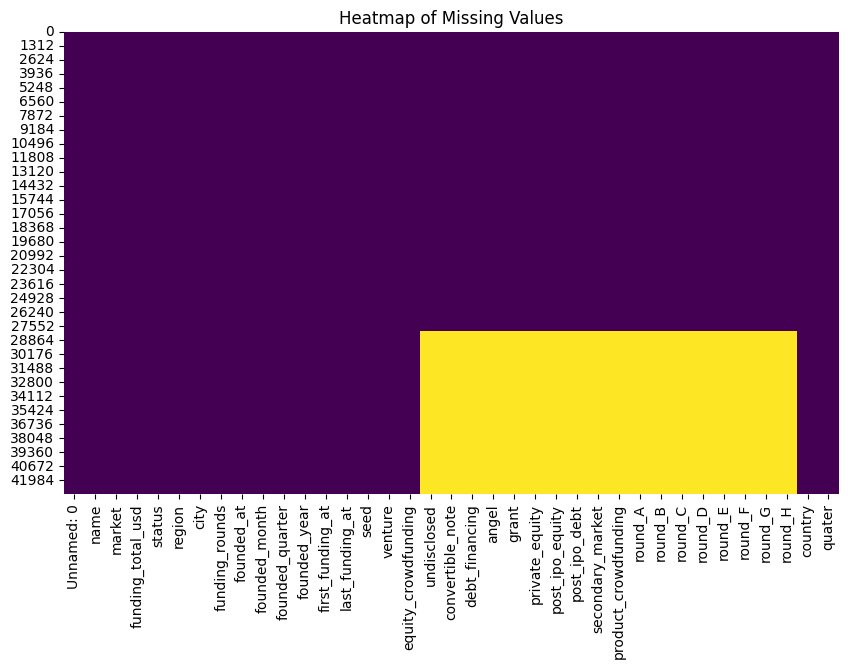

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap="viridis")
plt.title('Heatmap of Missing Values')
plt.show()

In [7]:
# As we see the status in in-balanced we are going to SMOTE that.
df['status'].value_counts(normalize=True)

status
operating    0.555561
acquired     0.222220
closed       0.222220
Name: proportion, dtype: float64

In [8]:
df['first_funding_at'] = pd.to_datetime(df['first_funding_at'], errors='coerce')
df['last_funding_at'] = pd.to_datetime(df['last_funding_at'], errors='coerce')
df['founded_at'] = pd.to_datetime(df['founded_at'],  errors='coerce')

###Feature Engineering

In [9]:
df['funding_category'] = df.apply(
    lambda x: 'Single Round - Traditional' if x['funding_rounds'] == 1 and x[['seed', 'venture']].sum() == 0
    else 'Single Round - Non-traditional' if x['funding_rounds'] == 1 and x[['seed', 'venture']].sum() > 0
    else 'Multiple Rounds', axis=1
)

In [10]:
current_year = datetime.now().year
df['company_age'] = current_year - df['founded_at'].dt.year

Remove unnecessary features for Peaklytics, as well as features that have high correlation with others.

In [11]:
df.drop(columns=['Unnamed: 0','round_G', 'round_H', 'founded_quarter', 'quater', 'founded_month', 'name', 'founded_year', 'founded_at', 'debt_financing', 'first_funding_at',	'last_funding_at'], inplace=True)

In [12]:

df['status']  = df['status'].apply(lambda x: 'operating' if x == 'acquired' else x)


In [13]:
df['status'].value_counts()

status
operating    33653
closed        9615
Name: count, dtype: int64

Save the cleaned data to a new csv file

In [14]:
df.to_csv('cleaned_peaklytics_data.csv', index=False)

# Preprocessing

In [15]:
cleaned_df = pd.read_csv('cleaned_peaklytics_data.csv')

In [16]:
cleaned_df.head()
cleaned_df.columns

Index(['market', 'funding_total_usd', 'status', 'region', 'city',
       'funding_rounds', 'seed', 'venture', 'equity_crowdfunding',
       'undisclosed', 'convertible_note', 'angel', 'grant', 'private_equity',
       'post_ipo_equity', 'post_ipo_debt', 'secondary_market',
       'product_crowdfunding', 'round_A', 'round_B', 'round_C', 'round_D',
       'round_E', 'round_F', 'country', 'funding_category', 'company_age'],
      dtype='object')

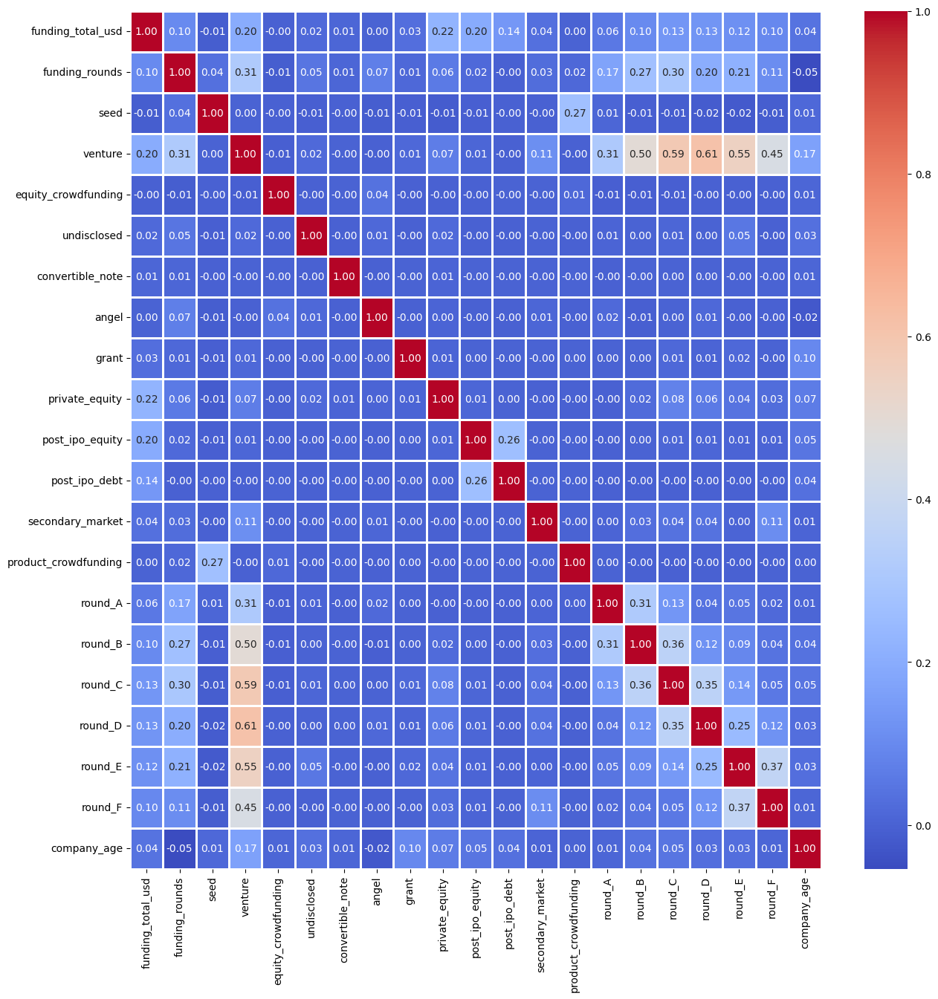

In [17]:
numerical_columns = cleaned_df.select_dtypes(include=['number']).columns

corr_matrix = cleaned_df[numerical_columns].corr()
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.8, fmt='.2f', ax=ax)
plt.show()

In [18]:
missing_percentage = (cleaned_df.isnull().sum() / df.shape[0]) * 100
missing_percentage_sorted = missing_percentage.sort_values(ascending=False)

print(missing_percentage_sorted)

private_equity          35.356383
undisclosed             35.356383
post_ipo_debt           35.356383
post_ipo_equity         35.356383
round_A                 35.356383
grant                   35.356383
angel                   35.356383
convertible_note        35.356383
round_B                 35.356383
product_crowdfunding    35.356383
round_C                 35.356383
round_D                 35.356383
round_E                 35.356383
round_F                 35.356383
secondary_market        35.356383
country                  0.000000
funding_category         0.000000
market                   0.000000
funding_total_usd        0.000000
equity_crowdfunding      0.000000
venture                  0.000000
seed                     0.000000
funding_rounds           0.000000
city                     0.000000
region                   0.000000
status                   0.000000
company_age              0.000000
dtype: float64


In [19]:
cleaned_df.dropna(inplace=True)

In [20]:
missing_percentage = (cleaned_df.isnull().sum() / cleaned_df.shape[0]) * 100
missing_percentage_sorted = missing_percentage.sort_values(ascending=False)

print(missing_percentage_sorted)

market                  0.0
post_ipo_equity         0.0
funding_category        0.0
country                 0.0
round_F                 0.0
round_E                 0.0
round_D                 0.0
round_C                 0.0
round_B                 0.0
round_A                 0.0
product_crowdfunding    0.0
secondary_market        0.0
post_ipo_debt           0.0
private_equity          0.0
funding_total_usd       0.0
grant                   0.0
angel                   0.0
convertible_note        0.0
undisclosed             0.0
equity_crowdfunding     0.0
venture                 0.0
seed                    0.0
funding_rounds          0.0
city                    0.0
region                  0.0
status                  0.0
company_age             0.0
dtype: float64


## Removing outliers, scaling, encoding, and imputing

In [21]:
numerical_columns = cleaned_df.select_dtypes(include=['number']).columns
numerical_columns

Index(['funding_total_usd', 'funding_rounds', 'seed', 'venture',
       'equity_crowdfunding', 'undisclosed', 'convertible_note', 'angel',
       'grant', 'private_equity', 'post_ipo_equity', 'post_ipo_debt',
       'secondary_market', 'product_crowdfunding', 'round_A', 'round_B',
       'round_C', 'round_D', 'round_E', 'round_F', 'company_age'],
      dtype='object')

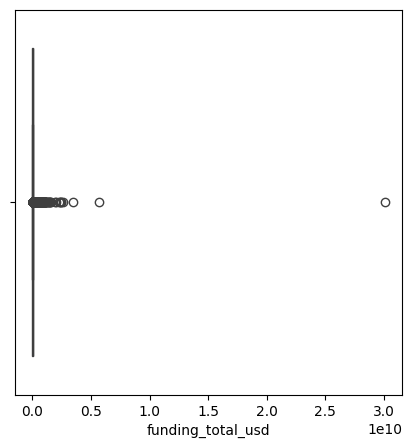

In [22]:
fig, ax = plt.subplots(figsize=(5,5))
sns.boxplot(x='funding_total_usd', data=cleaned_df, ax=ax)
plt.show()

In [23]:
# https://www.geeksforgeeks.org/detect-and-remove-the-outliers-using-python/

Q1 = cleaned_df['funding_total_usd'].quantile(0.25)
Q3 = cleaned_df['funding_total_usd'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.25 * IQR
upper_bound = Q3 + 1.25 * IQR

cleaned_df = cleaned_df[(cleaned_df['funding_total_usd'] >= lower_bound) & (cleaned_df['funding_total_usd'] <= upper_bound)]

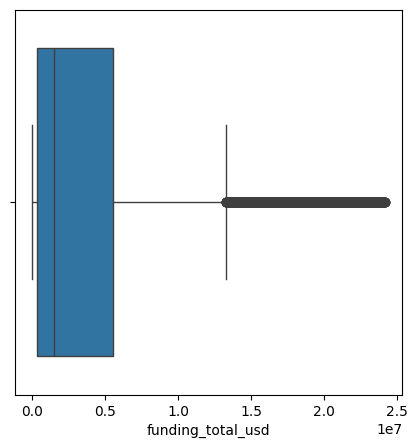

In [24]:
fig, ax = plt.subplots(figsize=(5,5))
sns.boxplot(x='funding_total_usd', data=cleaned_df, ax=ax)
plt.show()

In [25]:
duplicates_before = cleaned_df.duplicated().sum()
print(duplicates_before)
cleaned_df.drop_duplicates(inplace=True)

58


In [26]:
duplicates_after = cleaned_df.duplicated().sum()
print(duplicates_after)

0


In [27]:
cleaned_df[['market', 'country', 'funding_category', 'city', 'region']].nunique()

market               678
country              103
funding_category       3
city                2810
region               863
dtype: int64

In [28]:
cleaned_df = pd.get_dummies(cleaned_df, columns=['funding_category', 'country'], drop_first=True)
cleaned_df.head()

,market,funding_total_usd,status,region,city,funding_rounds,seed,venture,equity_crowdfunding,undisclosed,...,country_Tunisia,country_Turkey,country_Uganda,country_Ukraine,country_United Arab Emirates,country_United Kingdom,country_United States,country_Uruguay,country_Uzbekistan,country_Viet Nam
0,News,1750000.0,operating,New York City,New York,1.0,1750000.0,0.0,0.0,0.0,...,False,False,False,False,False,False,True,False,False,False
1,Publishing,40000.0,operating,Tallinn,Tallinn,1.0,40000.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False
2,Electronics,1500000.0,operating,London,London,1.0,1500000.0,0.0,0.0,0.0,...,False,False,False,False,False,True,False,False,False,False
3,Tourism,60000.0,operating,Dallas,Fort Worth,2.0,0.0,0.0,60000.0,0.0,...,False,False,False,False,False,False,True,False,False,False
4,E-Commerce,40000.0,operating,Santiago,Las Condes,1.0,40000.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False


In [29]:
market_freq = cleaned_df['market'].value_counts(normalize=True)
cleaned_df['market_freq'] = cleaned_df['market'].map(market_freq)

city_freq = cleaned_df['city'].value_counts(normalize=True)
cleaned_df['city_freq'] = cleaned_df['city'].map(city_freq)

region_freq = cleaned_df['region'].value_counts(normalize=True)
cleaned_df['region_freq'] = cleaned_df['region'].map(region_freq)

cleaned_df = cleaned_df.drop(columns=['market', 'city', 'region'])
cleaned_df.head()

,funding_total_usd,status,funding_rounds,seed,venture,equity_crowdfunding,undisclosed,convertible_note,angel,grant,...,country_Ukraine,country_United Arab Emirates,country_United Kingdom,country_United States,country_Uruguay,country_Uzbekistan,country_Viet Nam,market_freq,city_freq,region_freq
0,1750000.0,operating,1.0,1750000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,False,False,True,False,False,False,0.007591,0.061900,0.068442
1,40000.0,operating,1.0,40000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,0.001678,0.001090,0.001090
2,1500000.0,operating,1.0,1500000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,False,True,False,False,False,False,0.000755,0.033256,0.040134
3,60000.0,operating,2.0,0.0,0.0,60000.0,0.0,0.0,0.0,0.0,...,False,False,False,True,False,False,False,0.000545,0.000419,0.009688
4,40000.0,operating,1.0,40000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,0.036234,0.000084,0.004991


In [30]:
le = LabelEncoder()
cleaned_df['status'] = le.fit_transform(cleaned_df['status'])

In [31]:
import joblib
import pandas as pd

# Assuming you have the preprocessing done, save encoders and mappings
le = LabelEncoder()
cleaned_df['status'] = le.fit_transform(cleaned_df['status'])

# Save label encoder for 'status'
joblib.dump(le, 'status_encoder.pkl')

joblib.dump(market_freq, 'market_freq.pkl')
joblib.dump(city_freq, 'city_freq.pkl')
joblib.dump(region_freq, 'region_freq.pkl')


['region_freq.pkl']

In [32]:
cleaned_df.shape

(23845, 129)

In [33]:
total_null_values = cleaned_df.isnull().sum().sum()
print(f"Total null values: {total_null_values}")

Total null values: 0


In [34]:
cleaned_df.columns

Index(['funding_total_usd', 'status', 'funding_rounds', 'seed', 'venture',
       'equity_crowdfunding', 'undisclosed', 'convertible_note', 'angel',
       'grant',
       ...
       'country_Ukraine', 'country_United Arab Emirates',
       'country_United Kingdom', 'country_United States', 'country_Uruguay',
       'country_Uzbekistan', 'country_Viet Nam', 'market_freq', 'city_freq',
       'region_freq'],
      dtype='object', length=129)

##Handle imbalanced data, Splitting the data.

In [35]:
X = cleaned_df.drop(columns=['status'])
y = cleaned_df['status']

# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Further split the resampled data into training and validation sets for validating
X_train, X_val, y_train, y_val = train_test_split(X_train_resampled, y_train_resampled, test_size=0.2, random_state=42)

# Initialize the StandardScaler
scaler = StandardScaler()

# Scale numerical columns for training, validation, and test sets after splitting for sure ( Data leackage )
X_train[numerical_columns] = scaler.fit_transform(X_train[numerical_columns])
X_val[numerical_columns] = scaler.transform(X_val[numerical_columns])
X_test[numerical_columns] = scaler.transform(X_test[numerical_columns])
joblib.dump(scaler, 'scaler.pkl')

['scaler.pkl']

In [36]:
from sklearn.dummy import DummyClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix


baseline_model = DummyClassifier(strategy='stratified')
baseline_model.fit(X_train_resampled, y_train_resampled)

y_pred_baseline = baseline_model.predict(X_test)


accuracy_baseline = accuracy_score(y_test, y_pred_baseline)
precision_baseline = precision_score(y_test, y_pred_baseline, average='weighted')
recall_baseline = recall_score(y_test, y_pred_baseline, average='weighted')
f1_baseline = f1_score(y_test, y_pred_baseline, average='weighted')
conf_matrix = confusion_matrix(y_test, y_pred_baseline)


print(f"Baseline Accuracy: {accuracy_baseline}")
print(f"Baseline Precision: {precision_baseline}")
print(f"Baseline Recall: {recall_baseline}")
print(f"Baseline F1 Score: {f1_baseline}")
print("Confusion Matrix:")
print(conf_matrix)

Baseline Accuracy: 0.5059760956175299
Baseline Precision: 0.8982988450497652
Baseline Recall: 0.5059760956175299
Baseline F1 Score: 0.6277813149944967
Confusion Matrix:
[[ 141  125]
 [2231 2272]]




---



1. Hyperparameter Tuning: Use Optuna with cross-validation to find the best hyperparameters.
2. Model Training: Train the model using the best hyperparameters and early stopping with a validation set.
3. Model Evaluation: Evaluate the model on the test set to get final performance metrics.

In [37]:
# Clean up column names for both train and test sets
X_train_resampled.columns = X_train_resampled.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)
X_test.columns = X_test.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)

# Objective function for Optuna
def objective(trial):
    param = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 6),
        'num_leaves': trial.suggest_int('num_leaves', 20, 50),
        'min_child_samples': trial.suggest_int('min_child_samples', 20, 100),
        'subsample': trial.suggest_float('subsample', 0.6, 0.9),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 0.9),
        'reg_alpha': trial.suggest_float('reg_alpha', 1, 10.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 1, 10.0),
        'drop_rate': trial.suggest_float('drop_rate', 0.2, 0.4),
        'max_drop': trial.suggest_int('max_drop', 5, 30),
        'random_state': 45
    }

    # Initialize the model with the suggested parameters
    lgbm_model = LGBMClassifier(**param)

    # Perform cross-validation to evaluate the model's performance
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    f1 = cross_val_score(lgbm_model, X_train_resampled, y_train_resampled, cv=cv, scoring='f1', n_jobs=-1).mean()

    return f1

# Optimize hyperparameters using Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Best hyperparameters found by Optuna
best_params = study.best_params
print("Best hyperparameters found by Optuna:", best_params)

# Train the model with the best parameters
lgbm_model = LGBMClassifier(**best_params)

[I 2024-10-23 10:18:19,473] A new study created in memory with name: no-name-a7777469-d24f-4733-a7b6-c0193304a75b


[LightGBM] [Info] Number of positive: 14401, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Number of positive: 14401, number of negative: 14401
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14401
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3584
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024872 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3604
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 52
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 53
[Li

[I 2024-10-23 10:18:24,344] Trial 0 finished with value: 0.8994616423447044 and parameters: {'learning_rate': 0.04006927781512713, 'n_estimators': 292, 'max_depth': 3, 'num_leaves': 23, 'min_child_samples': 77, 'subsample': 0.6132277383169767, 'colsample_bytree': 0.8818213609051404, 'reg_alpha': 4.988368304663092, 'reg_lambda': 1.899907320401462, 'drop_rate': 0.23923591705856517, 'max_drop': 6}. Best is trial 0 with value: 0.8994616423447044.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosi

[I 2024-10-23 10:18:26,864] Trial 1 finished with value: 0.9291279005936302 and parameters: {'learning_rate': 0.05025148575295773, 'n_estimators': 256, 'max_depth': 5, 'num_leaves': 20, 'min_child_samples': 54, 'subsample': 0.7193367003334963, 'colsample_bytree': 0.8041109439241676, 'reg_alpha': 6.2829893760697155, 'reg_lambda': 6.100660829252805, 'drop_rate': 0.31618277512743675, 'max_drop': 18}. Best is trial 1 with value: 0.9291279005936302.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:18:28,335] Trial 2 finished with value: 0.909553472651103 and parameters: {'learning_rate': 0.060177632883587406, 'n_estimators': 134, 'max_depth': 4, 'num_leaves': 30, 'min_child_samples': 41, 'subsample': 0.8666722956841328, 'colsample_bytree': 0.7306190741025529, 'reg_alpha': 5.739335934406499, 'reg_lambda': 5.298540835396995, 'drop_rate': 0.25151274523997147, 'max_drop': 19}. Best is trial 1 with value: 0.9291279005936302.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:18:31,867] Trial 3 finished with value: 0.9554323379581682 and parameters: {'learning_rate': 0.09034164999886247, 'n_estimators': 307, 'max_depth': 6, 'num_leaves': 20, 'min_child_samples': 21, 'subsample': 0.6356473749449912, 'colsample_bytree': 0.7385382767904484, 'reg_alpha': 3.030982003504727, 'reg_lambda': 4.198598628374521, 'drop_rate': 0.2118444308609569, 'max_drop': 11}. Best is trial 3 with value: 0.9554323379581682.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013409 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3647
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 70
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017620 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.

[I 2024-10-23 10:18:34,602] Trial 4 finished with value: 0.9462692287033947 and parameters: {'learning_rate': 0.091018468741976, 'n_estimators': 355, 'max_depth': 4, 'num_leaves': 48, 'min_child_samples': 30, 'subsample': 0.8000159601491962, 'colsample_bytree': 0.7131975857457178, 'reg_alpha': 3.9034223021198398, 'reg_lambda': 3.6445173137506286, 'drop_rate': 0.27323678887038017, 'max_drop': 7}. Best is trial 3 with value: 0.9554323379581682.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:18:35,458] Trial 5 finished with value: 0.8779454410703442 and parameters: {'learning_rate': 0.061803253436049, 'n_estimators': 113, 'max_depth': 3, 'num_leaves': 34, 'min_child_samples': 83, 'subsample': 0.8748205887296574, 'colsample_bytree': 0.8919143065502964, 'reg_alpha': 7.02420724705833, 'reg_lambda': 1.7593103366336953, 'drop_rate': 0.22296206428222198, 'max_drop': 17}. Best is trial 3 with value: 0.9554323379581682.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[I 2024-10-23 10:18:36,704] Trial 6 finished with value: 0.9118094281717362 and parameters: {'learning_rate': 0.06973294617035652, 'n_estimators': 133, 'max_depth': 4, 'num_leaves': 34, 'min_child_samples': 33, 'subsample': 0.7655895819546358, 'colsample_bytree': 0.6295229645278361, 'reg_alpha': 9.600596475126356, 'reg_lambda': 5.398617637232852, 'drop_rate': 0.2276115012705521, 'max_drop': 17}. Best is trial 3 with value: 0.9554323379581682.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:18:38,411] Trial 7 finished with value: 0.9141996586691944 and parameters: {'learning_rate': 0.0463082974479974, 'n_estimators': 151, 'max_depth': 5, 'num_leaves': 21, 'min_child_samples': 26, 'subsample': 0.880634177582317, 'colsample_bytree': 0.6804594605522112, 'reg_alpha': 2.334922082195573, 'reg_lambda': 4.444585232405773, 'drop_rate': 0.23719882581047502, 'max_drop': 26}. Best is trial 3 with value: 0.9554323379581682.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:18:43,574] Trial 8 finished with value: 0.9474915566304419 and parameters: {'learning_rate': 0.04482693352024012, 'n_estimators': 473, 'max_depth': 6, 'num_leaves': 29, 'min_child_samples': 79, 'subsample': 0.8801042079759682, 'colsample_bytree': 0.7685715439940276, 'reg_alpha': 3.445665929826232, 'reg_lambda': 9.085727746480485, 'drop_rate': 0.23084845843963764, 'max_drop': 30}. Best is trial 3 with value: 0.9554323379581682.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:18:45,588] Trial 9 finished with value: 0.9169792767879758 and parameters: {'learning_rate': 0.040166360899911324, 'n_estimators': 265, 'max_depth': 4, 'num_leaves': 29, 'min_child_samples': 96, 'subsample': 0.7392049727301259, 'colsample_bytree': 0.7962909713845734, 'reg_alpha': 7.065521061624316, 'reg_lambda': 3.5143481627041857, 'drop_rate': 0.24120548773025824, 'max_drop': 7}. Best is trial 3 with value: 0.9554323379581682.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:18:50,093] Trial 10 finished with value: 0.9569750492867264 and parameters: {'learning_rate': 0.09521171918949806, 'n_estimators': 392, 'max_depth': 6, 'num_leaves': 45, 'min_child_samples': 61, 'subsample': 0.6027917390501141, 'colsample_bytree': 0.6114184270485845, 'reg_alpha': 2.1268960291513164, 'reg_lambda': 7.6708603981324, 'drop_rate': 0.3759547627348046, 'max_drop': 12}. Best is trial 10 with value: 0.9569750492867264.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:18:54,660] Trial 11 finished with value: 0.9582132642638594 and parameters: {'learning_rate': 0.0987375995636011, 'n_estimators': 403, 'max_depth': 6, 'num_leaves': 47, 'min_child_samples': 57, 'subsample': 0.6073718108765009, 'colsample_bytree': 0.620328780684472, 'reg_alpha': 1.2531184463632172, 'reg_lambda': 7.54031660054331, 'drop_rate': 0.38389518264949035, 'max_drop': 12}. Best is trial 11 with value: 0.9582132642638594.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

[I 2024-10-23 10:19:00,899] Trial 12 finished with value: 0.9129690715460989 and parameters: {'learning_rate': 0.012349445246714302, 'n_estimators': 439, 'max_depth': 6, 'num_leaves': 47, 'min_child_samples': 58, 'subsample': 0.6615604359880183, 'colsample_bytree': 0.61610360811195, 'reg_alpha': 1.0210258365196274, 'reg_lambda': 8.018820282208388, 'drop_rate': 0.3909671649974118, 'max_drop': 12}. Best is trial 11 with value: 0.9582132642638594.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:19:04,539] Trial 13 finished with value: 0.9499115506714286 and parameters: {'learning_rate': 0.07936974668530826, 'n_estimators': 399, 'max_depth': 5, 'num_leaves': 43, 'min_child_samples': 67, 'subsample': 0.6785922681097034, 'colsample_bytree': 0.6615463573329067, 'reg_alpha': 1.150497749097632, 'reg_lambda': 7.42643167519226, 'drop_rate': 0.38913533762513736, 'max_drop': 12}. Best is trial 11 with value: 0.9582132642638594.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3616
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 61
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3634
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 59
[LightG

[I 2024-10-23 10:19:09,058] Trial 14 finished with value: 0.9563148515295519 and parameters: {'learning_rate': 0.09819350083989854, 'n_estimators': 376, 'max_depth': 6, 'num_leaves': 41, 'min_child_samples': 48, 'subsample': 0.602330312558075, 'colsample_bytree': 0.6044723671609507, 'reg_alpha': 1.963444688375797, 'reg_lambda': 9.51233239293625, 'drop_rate': 0.3493014532560814, 'max_drop': 14}. Best is trial 11 with value: 0.9582132642638594.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:19:14,708] Trial 15 finished with value: 0.9571815072251706 and parameters: {'learning_rate': 0.07834795915774725, 'n_estimators': 495, 'max_depth': 6, 'num_leaves': 41, 'min_child_samples': 68, 'subsample': 0.6745185138200785, 'colsample_bytree': 0.6595101415764018, 'reg_alpha': 4.402061258910202, 'reg_lambda': 7.021869185347988, 'drop_rate': 0.35566176418251283, 'max_drop': 22}. Best is trial 11 with value: 0.9582132642638594.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:19:19,679] Trial 16 finished with value: 0.9548985638762325 and parameters: {'learning_rate': 0.07875824313635718, 'n_estimators': 496, 'max_depth': 5, 'num_leaves': 39, 'min_child_samples': 68, 'subsample': 0.6911378584483898, 'colsample_bytree': 0.6705677877492557, 'reg_alpha': 4.531021908493278, 'reg_lambda': 6.612987517682499, 'drop_rate': 0.3303096275703583, 'max_drop': 22}. Best is trial 11 with value: 0.9582132642638594.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins

[I 2024-10-23 10:19:25,124] Trial 17 finished with value: 0.95337768104712 and parameters: {'learning_rate': 0.07990692105814623, 'n_estimators': 462, 'max_depth': 6, 'num_leaves': 50, 'min_child_samples': 92, 'subsample': 0.648962072585086, 'colsample_bytree': 0.6518139794840772, 'reg_alpha': 9.041061007573411, 'reg_lambda': 8.37834356670952, 'drop_rate': 0.3610995674545557, 'max_drop': 23}. Best is trial 11 with value: 0.9582132642638594.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007807 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins

[I 2024-10-23 10:19:29,250] Trial 18 finished with value: 0.9491729954787044 and parameters: {'learning_rate': 0.071537017186067, 'n_estimators': 429, 'max_depth': 5, 'num_leaves': 39, 'min_child_samples': 71, 'subsample': 0.7001209081490412, 'colsample_bytree': 0.6967428353684149, 'reg_alpha': 7.967769586724032, 'reg_lambda': 6.865959369520184, 'drop_rate': 0.28817634945537396, 'max_drop': 22}. Best is trial 11 with value: 0.9582132642638594.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013083 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3616
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 61
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3634
[LightGBM] [Info] Number of data poi

[I 2024-10-23 10:19:34,193] Trial 19 finished with value: 0.9298211430028376 and parameters: {'learning_rate': 0.02605163294281929, 'n_estimators': 334, 'max_depth': 6, 'num_leaves': 37, 'min_child_samples': 49, 'subsample': 0.785926246836198, 'colsample_bytree': 0.6479945545726914, 'reg_alpha': 4.46953444317689, 'reg_lambda': 8.414688485894267, 'drop_rate': 0.34346365866425904, 'max_drop': 26}. Best is trial 11 with value: 0.9582132642638594.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:19:36,649] Trial 20 finished with value: 0.943680451304419 and parameters: {'learning_rate': 0.08758885833292268, 'n_estimators': 211, 'max_depth': 5, 'num_leaves': 43, 'min_child_samples': 40, 'subsample': 0.6419861997121196, 'colsample_bytree': 0.8487012427605103, 'reg_alpha': 2.89995254009911, 'reg_lambda': 6.2328313100823065, 'drop_rate': 0.39957170616647314, 'max_drop': 15}. Best is trial 11 with value: 0.9582132642638594.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3590
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 56
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead 

[I 2024-10-23 10:19:41,262] Trial 21 finished with value: 0.9586103725300946 and parameters: {'learning_rate': 0.09928114810109674, 'n_estimators': 409, 'max_depth': 6, 'num_leaves': 45, 'min_child_samples': 61, 'subsample': 0.6224627461155371, 'colsample_bytree': 0.6295161423423259, 'reg_alpha': 1.8252104351829046, 'reg_lambda': 7.539529822113856, 'drop_rate': 0.37207283946768266, 'max_drop': 10}. Best is trial 21 with value: 0.9586103725300946.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:19:46,557] Trial 22 finished with value: 0.9584846338812978 and parameters: {'learning_rate': 0.09724895931592133, 'n_estimators': 423, 'max_depth': 6, 'num_leaves': 45, 'min_child_samples': 61, 'subsample': 0.6255343425420147, 'colsample_bytree': 0.6388146840688645, 'reg_alpha': 1.5792121718977064, 'reg_lambda': 7.152329204624954, 'drop_rate': 0.3728161710569578, 'max_drop': 9}. Best is trial 21 with value: 0.9586103725300946.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3590
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 56
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018456 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3614
[LightGBM] [Info] Number 

[I 2024-10-23 10:19:52,168] Trial 23 finished with value: 0.9580323585921832 and parameters: {'learning_rate': 0.09922847751163788, 'n_estimators': 420, 'max_depth': 6, 'num_leaves': 50, 'min_child_samples': 60, 'subsample': 0.6320635334728858, 'colsample_bytree': 0.6371481945294135, 'reg_alpha': 1.7806449486366, 'reg_lambda': 8.747487115911479, 'drop_rate': 0.3724152592213224, 'max_drop': 9}. Best is trial 21 with value: 0.9586103725300946.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

[I 2024-10-23 10:19:56,428] Trial 24 finished with value: 0.9551135521336246 and parameters: {'learning_rate': 0.08559148360393366, 'n_estimators': 351, 'max_depth': 6, 'num_leaves': 46, 'min_child_samples': 53, 'subsample': 0.6202708355995844, 'colsample_bytree': 0.6014186037749587, 'reg_alpha': 1.4967505202808056, 'reg_lambda': 7.456230406881364, 'drop_rate': 0.3242725459021018, 'max_drop': 9}. Best is trial 21 with value: 0.9586103725300946.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007061 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3633
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 63
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead 

[I 2024-10-23 10:20:00,477] Trial 25 finished with value: 0.9547004951420567 and parameters: {'learning_rate': 0.09929145213633464, 'n_estimators': 449, 'max_depth': 5, 'num_leaves': 44, 'min_child_samples': 42, 'subsample': 0.8286972193840918, 'colsample_bytree': 0.7090995343299646, 'reg_alpha': 2.650244078375583, 'reg_lambda': 9.784217345685134, 'drop_rate': 0.36963231211102043, 'max_drop': 5}. Best is trial 21 with value: 0.9586103725300946.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006027 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3590
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 56
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-10-23 10:20:05,168] Trial 26 finished with value: 0.9570336895334165 and parameters: {'learning_rate': 0.08549911235468192, 'n_estimators': 397, 'max_depth': 6, 'num_leaves': 47, 'min_child_samples': 61, 'subsample': 0.6586587497865959, 'colsample_bytree': 0.6891929307801036, 'reg_alpha': 3.6056935906170384, 'reg_lambda': 5.991231842808633, 'drop_rate': 0.3079301881172238, 'max_drop': 14}. Best is trial 21 with value: 0.9586103725300946.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing r

[I 2024-10-23 10:20:08,287] Trial 27 finished with value: 0.9495605242040728 and parameters: {'learning_rate': 0.09223168747648955, 'n_estimators': 329, 'max_depth': 5, 'num_leaves': 41, 'min_child_samples': 74, 'subsample': 0.7040836393408907, 'colsample_bytree': 0.6314165710343483, 'reg_alpha': 1.6587132761154568, 'reg_lambda': 7.863337567548658, 'drop_rate': 0.3382022576580802, 'max_drop': 9}. Best is trial 21 with value: 0.9586103725300946.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:20:13,384] Trial 28 finished with value: 0.9541446561104376 and parameters: {'learning_rate': 0.07318194440858997, 'n_estimators': 416, 'max_depth': 6, 'num_leaves': 49, 'min_child_samples': 83, 'subsample': 0.7292508178659909, 'colsample_bytree': 0.6248887052598756, 'reg_alpha': 2.6693909622473972, 'reg_lambda': 9.10339123102717, 'drop_rate': 0.38674261415434047, 'max_drop': 10}. Best is trial 21 with value: 0.9586103725300946.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013428 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3616
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 61
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2024-10-23 10:20:15,530] Trial 29 finished with value: 0.9003177412997548 and parameters: {'learning_rate': 0.030076546635902337, 'n_estimators': 371, 'max_depth': 3, 'num_leaves': 45, 'min_child_samples': 47, 'subsample': 0.6178147214206252, 'colsample_bytree': 0.8615216740356705, 'reg_alpha': 1.0164413077540715, 'reg_lambda': 1.2142926412583739, 'drop_rate': 0.37832763912822587, 'max_drop': 7}. Best is trial 21 with value: 0.9586103725300946.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:20:18,905] Trial 30 finished with value: 0.9473509826664437 and parameters: {'learning_rate': 0.06451367455419937, 'n_estimators': 291, 'max_depth': 6, 'num_leaves': 26, 'min_child_samples': 54, 'subsample': 0.6262227378358101, 'colsample_bytree': 0.7625560964693077, 'reg_alpha': 5.6425000809496275, 'reg_lambda': 4.849759609201617, 'drop_rate': 0.3598360369084098, 'max_drop': 5}. Best is trial 21 with value: 0.9586103725300946.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:20:24,046] Trial 31 finished with value: 0.9576604799032034 and parameters: {'learning_rate': 0.09981672046680086, 'n_estimators': 427, 'max_depth': 6, 'num_leaves': 50, 'min_child_samples': 62, 'subsample': 0.6328036298564462, 'colsample_bytree': 0.6394452085173652, 'reg_alpha': 1.8525627245680847, 'reg_lambda': 8.639244800907946, 'drop_rate': 0.3672831623117039, 'max_drop': 9}. Best is trial 21 with value: 0.9586103725300946.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:20:29,784] Trial 32 finished with value: 0.9587995946837434 and parameters: {'learning_rate': 0.09372372936732656, 'n_estimators': 467, 'max_depth': 6, 'num_leaves': 48, 'min_child_samples': 57, 'subsample': 0.6083262532494524, 'colsample_bytree': 0.6384305099394054, 'reg_alpha': 1.6316485314266078, 'reg_lambda': 7.015931213108239, 'drop_rate': 0.3996953881952186, 'max_drop': 8}. Best is trial 32 with value: 0.9587995946837434.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:20:35,277] Trial 33 finished with value: 0.9586098266784007 and parameters: {'learning_rate': 0.08455732439785035, 'n_estimators': 474, 'max_depth': 6, 'num_leaves': 47, 'min_child_samples': 55, 'subsample': 0.6088888960695398, 'colsample_bytree': 0.6702778306258694, 'reg_alpha': 2.351602083044381, 'reg_lambda': 6.915077084728055, 'drop_rate': 0.3977530354386486, 'max_drop': 7}. Best is trial 32 with value: 0.9587995946837434.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006815 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3588
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 55
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2024-10-23 10:20:39,992] Trial 34 finished with value: 0.9543584928395994 and parameters: {'learning_rate': 0.08521099532279892, 'n_estimators': 471, 'max_depth': 5, 'num_leaves': 48, 'min_child_samples': 65, 'subsample': 0.6616282148039684, 'colsample_bytree': 0.6725172700846249, 'reg_alpha': 3.3180570484950556, 'reg_lambda': 5.8818222844826265, 'drop_rate': 0.3980670018593172, 'max_drop': 6}. Best is trial 32 with value: 0.9587995946837434.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005897 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3610
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 58
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead 

[I 2024-10-23 10:20:45,350] Trial 35 finished with value: 0.9589017565261276 and parameters: {'learning_rate': 0.09258723846260533, 'n_estimators': 456, 'max_depth': 6, 'num_leaves': 42, 'min_child_samples': 54, 'subsample': 0.6176361687196356, 'colsample_bytree': 0.7143135952492282, 'reg_alpha': 2.4140352579800095, 'reg_lambda': 6.385152852821253, 'drop_rate': 0.3980168319302917, 'max_drop': 8}. Best is trial 35 with value: 0.9589017565261276.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013689 seconds.
You 

[I 2024-10-23 10:20:51,809] Trial 36 finished with value: 0.9590599096111563 and parameters: {'learning_rate': 0.09177789470563766, 'n_estimators': 480, 'max_depth': 6, 'num_leaves': 42, 'min_child_samples': 43, 'subsample': 0.6035206652314395, 'colsample_bytree': 0.7157143570451675, 'reg_alpha': 5.1834720466320325, 'reg_lambda': 6.55394393587008, 'drop_rate': 0.3989306712182033, 'max_drop': 8}. Best is trial 36 with value: 0.9590599096111563.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:20:56,349] Trial 37 finished with value: 0.9543575255987673 and parameters: {'learning_rate': 0.08989089402581915, 'n_estimators': 451, 'max_depth': 5, 'num_leaves': 37, 'min_child_samples': 37, 'subsample': 0.6488928133098927, 'colsample_bytree': 0.7327112860821543, 'reg_alpha': 6.177631883266182, 'reg_lambda': 6.42874408922905, 'drop_rate': 0.38347615502723664, 'max_drop': 15}. Best is trial 36 with value: 0.9590599096111563.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:21:02,846] Trial 38 finished with value: 0.9535167687462472 and parameters: {'learning_rate': 0.05354240028808577, 'n_estimators': 500, 'max_depth': 6, 'num_leaves': 32, 'min_child_samples': 45, 'subsample': 0.6742313205632855, 'colsample_bytree': 0.7171220967460192, 'reg_alpha': 5.037328691704559, 'reg_lambda': 5.576844377535963, 'drop_rate': 0.2669507081485622, 'max_drop': 11}. Best is trial 36 with value: 0.9590599096111563.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:21:06,192] Trial 39 finished with value: 0.9509789255938659 and parameters: {'learning_rate': 0.09318109197351132, 'n_estimators': 482, 'max_depth': 4, 'num_leaves': 42, 'min_child_samples': 51, 'subsample': 0.8384908398990369, 'colsample_bytree': 0.790275276942764, 'reg_alpha': 4.007366597564638, 'reg_lambda': 4.865793724853724, 'drop_rate': 0.29371128961687404, 'max_drop': 8}. Best is trial 36 with value: 0.9590599096111563.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:21:08,499] Trial 40 finished with value: 0.9392165952796008 and parameters: {'learning_rate': 0.09264256530736291, 'n_estimators': 447, 'max_depth': 3, 'num_leaves': 39, 'min_child_samples': 35, 'subsample': 0.6444173733492832, 'colsample_bytree': 0.7011878393688115, 'reg_alpha': 7.177938787867612, 'reg_lambda': 3.222847497477875, 'drop_rate': 0.39126223427173434, 'max_drop': 6}. Best is trial 36 with value: 0.9590599096111563.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:21:14,129] Trial 41 finished with value: 0.9580444474013209 and parameters: {'learning_rate': 0.08531715304359462, 'n_estimators': 471, 'max_depth': 6, 'num_leaves': 43, 'min_child_samples': 56, 'subsample': 0.6120050794220303, 'colsample_bytree': 0.7282695059814628, 'reg_alpha': 2.4262097230067092, 'reg_lambda': 6.574640191655382, 'drop_rate': 0.3942590053342505, 'max_drop': 7}. Best is trial 36 with value: 0.9590599096111563.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:21:19,766] Trial 42 finished with value: 0.9596050096313776 and parameters: {'learning_rate': 0.08980805451286639, 'n_estimators': 461, 'max_depth': 6, 'num_leaves': 48, 'min_child_samples': 45, 'subsample': 0.6001705548255812, 'colsample_bytree': 0.7478535235725708, 'reg_alpha': 3.2302285304502174, 'reg_lambda': 5.569523739399006, 'drop_rate': 0.3999323649279271, 'max_drop': 8}. Best is trial 42 with value: 0.9596050096313776.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3647
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 70
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training fr

[I 2024-10-23 10:21:26,559] Trial 43 finished with value: 0.9604827544025294 and parameters: {'learning_rate': 0.09403036180707725, 'n_estimators': 450, 'max_depth': 6, 'num_leaves': 48, 'min_child_samples': 29, 'subsample': 0.6021622896286536, 'colsample_bytree': 0.7494471602120618, 'reg_alpha': 3.136041330323351, 'reg_lambda': 5.627207002215633, 'drop_rate': 0.381930149084943, 'max_drop': 11}. Best is trial 43 with value: 0.9604827544025294.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:21:29,531] Trial 44 finished with value: 0.945981030113743 and parameters: {'learning_rate': 0.07430484434181181, 'n_estimators': 206, 'max_depth': 6, 'num_leaves': 48, 'min_child_samples': 21, 'subsample': 0.6035395824998852, 'colsample_bytree': 0.7473835301003529, 'reg_alpha': 5.054542832031098, 'reg_lambda': 5.14533131616307, 'drop_rate': 0.38245657262746807, 'max_drop': 11}. Best is trial 43 with value: 0.9604827544025294.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:21:35,566] Trial 45 finished with value: 0.9566377069332951 and parameters: {'learning_rate': 0.06509558670755794, 'n_estimators': 459, 'max_depth': 6, 'num_leaves': 36, 'min_child_samples': 28, 'subsample': 0.7527481984041067, 'colsample_bytree': 0.776309313329406, 'reg_alpha': 3.1034725942217634, 'reg_lambda': 3.956056017060854, 'drop_rate': 0.3981592339587154, 'max_drop': 5}. Best is trial 43 with value: 0.9604827544025294.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:21:42,157] Trial 46 finished with value: 0.9598653901202041 and parameters: {'learning_rate': 0.08952239820906877, 'n_estimators': 485, 'max_depth': 6, 'num_leaves': 49, 'min_child_samples': 32, 'subsample': 0.6016064544543893, 'colsample_bytree': 0.7515121152445335, 'reg_alpha': 3.782983628831954, 'reg_lambda': 5.682913127041602, 'drop_rate': 0.38084591728637085, 'max_drop': 8}. Best is trial 43 with value: 0.9604827544025294.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3647
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 70
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.49998

[I 2024-10-23 10:21:46,834] Trial 47 finished with value: 0.9565218659924088 and parameters: {'learning_rate': 0.08218691382734668, 'n_estimators': 485, 'max_depth': 5, 'num_leaves': 49, 'min_child_samples': 31, 'subsample': 0.6397182478361452, 'colsample_bytree': 0.8188863265386563, 'reg_alpha': 3.8379376371810743, 'reg_lambda': 2.875418011519339, 'drop_rate': 0.21383910405008177, 'max_drop': 13}. Best is trial 43 with value: 0.9604827544025294.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006053 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3667
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 76
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14

[I 2024-10-23 10:21:52,821] Trial 48 finished with value: 0.9579377413712094 and parameters: {'learning_rate': 0.08859871917862554, 'n_estimators': 437, 'max_depth': 6, 'num_leaves': 46, 'min_child_samples': 23, 'subsample': 0.6006433480341867, 'colsample_bytree': 0.753054136995425, 'reg_alpha': 6.194497326994096, 'reg_lambda': 5.748671039618412, 'drop_rate': 0.355756848908136, 'max_drop': 11}. Best is trial 43 with value: 0.9604827544025294.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-23 10:21:57,382] Trial 49 finished with value: 0.9552512854368047 and parameters: {'learning_rate': 0.07660230613205511, 'n_estimators': 378, 'max_depth': 6, 'num_leaves': 32, 'min_child_samples': 38, 'subsample': 0.6194395392058897, 'colsample_bytree': 0.7232079407803839, 'reg_alpha': 4.23835288083224, 'reg_lambda': 4.64544029678335, 'drop_rate': 0.3811013113205506, 'max_drop': 8}. Best is trial 43 with value: 0.9604827544025294.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Best hyperparameters found by Optuna: {'learning_rate': 0.09403036180707725, 'n_estimators': 450, 'm

[LightGBM] [Info] Number of positive: 14391, number of negative: 14410
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004456 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3657
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 72
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499670 -> initscore=-0.001319
[LightGBM] [Info] Start training from score -0.001319
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

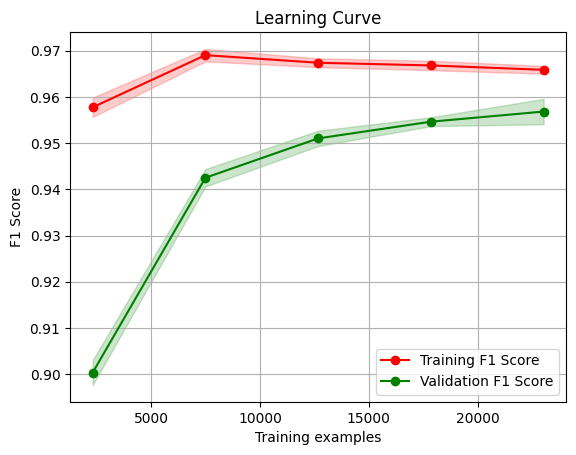

In [38]:
# Clean up column names for both train and test sets
X_train.columns = X_train.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)
X_val.columns = X_val.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)
X_test.columns = X_test.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)

lgbm_model.fit(X_train, y_train,
               eval_set=[(X_val, y_val)],
               eval_metric='f1',
               callbacks=[early_stopping(stopping_rounds=100), log_evaluation(50)])

# Evaluate the model
y_pred = lgbm_model.predict(X_test)
y_pred_proba = lgbm_model.predict_proba(X_test)[:, 1]

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_proba)

print(f"Test Accuracy: {accuracy:.2f}")
print(f"Test F1 Score: {f1:.2f}")
print(f"Test ROC AUC Score: {roc_auc:.2f}")

# Plot learning curve
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

train_sizes, train_scores, val_scores = learning_curve(
    lgbm_model, X_train, y_train, cv=cv, scoring='f1', n_jobs=-1)

# Calculate mean and standard deviation for training and validation scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
val_mean = np.mean(val_scores, axis=1)
val_std = np.std(val_scores, axis=1)

# Plot the learning curve
plt.figure()
plt.plot(train_sizes, train_mean, 'o-', color='r', label='Training F1 Score')
plt.plot(train_sizes, val_mean, 'o-', color='g', label='Validation F1 Score')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color='r', alpha=0.2)
plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, color='g', alpha=0.2)

plt.title('Learning Curve')
plt.xlabel('Training examples')
plt.ylabel('F1 Score')
plt.legend(loc='best')
plt.grid()
plt.show()

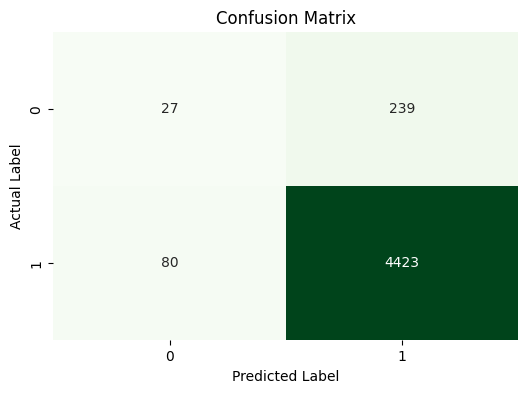

In [46]:
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Greens", cbar=False)
plt.title("Confusion Matrix")
plt.ylabel("Actual Label")
plt.xlabel("Predicted Label")
plt.show()

In [40]:
# Save the trained model to a file
#import pickle


#with open('final_lgbm_model_2', 'wb') as file:
    #pickle.dump(lgbm_model, file)

In [41]:
# Save the model using the LightGBM Booster
#lgbm_model.booster_.save_model('lgbm_model.txt')


In [42]:
!pip install shap


Expected Value: -0.8916979504512972
SHAP Values Type: <class 'numpy.ndarray'>
SHAP Values Length: 4769


/Users/SHAD/.pyenv/versions/3.10.6/envs/peaklytics/lib/python3.10/site-packages/shap/explainers/_tree.py:448: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


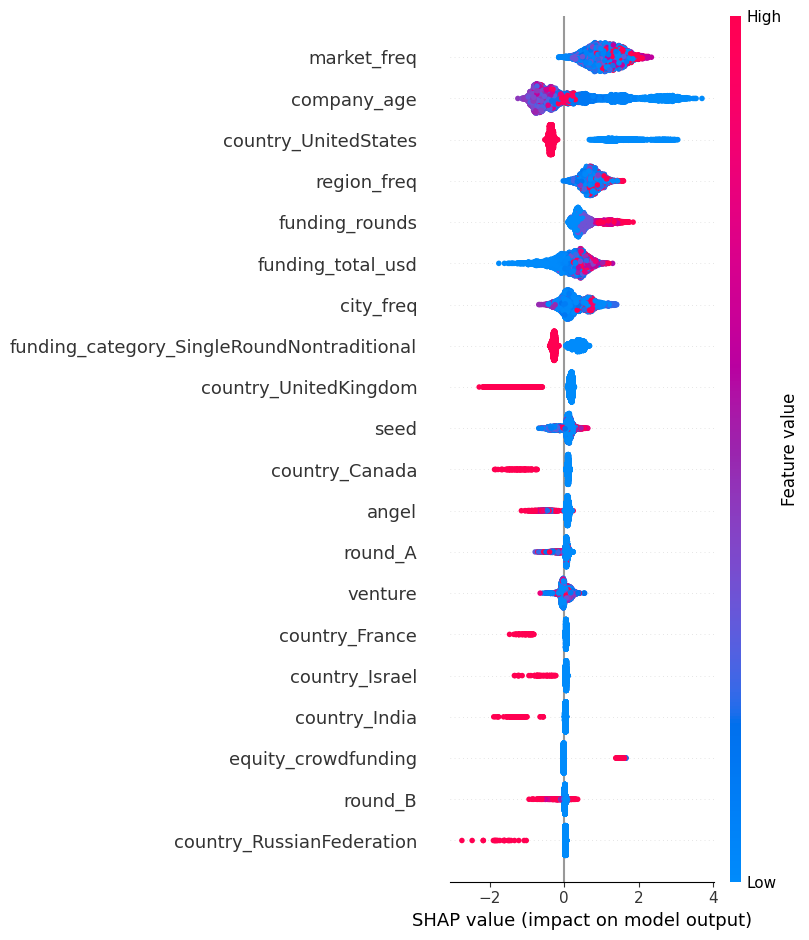

In [43]:
import shap

# Initialize the SHAP Tree explainer
explainer = shap.TreeExplainer(lgbm_model)
shap_values = explainer.shap_values(X_test)

# Check the structure of expected_value and shap_values
print("Expected Value:", explainer.expected_value)
print("SHAP Values Type:", type(shap_values))
print("SHAP Values Length:", len(shap_values))

# Access the SHAP values for the positive class
# Ensure that shap_values is a list and has the expected length
if isinstance(shap_values, list) and len(shap_values) > 1:
    shap_values_positive_class = shap_values[1]
else:
    shap_values_positive_class = shap_values  # Fallback if not a list

# Visualize the SHAP values for a single prediction
shap.initjs()
shap.force_plot(explainer.expected_value[1] if isinstance(explainer.expected_value, list) else explainer.expected_value,
                shap_values_positive_class[0], X_test.iloc[0])

# Summary plot for feature importance
shap.summary_plot(shap_values_positive_class, X_test)